In [1]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

path = './input/task3/'

%run utils.py

In [2]:
colors = ['ffffff', '00ff00', '0000ff', 'ff0000', 'ff00ff', '00ffff', 'ffff00', '66ff00']
def get_color(n):
    color = colors[n]
    r = int(color[0:2],16)
    g = int(color[2:4],16)
    b = int(color[4:6],16)
    return (b,r,g)

In [3]:
def show_points(num_order):
    img = cv2.imread(path + "img-%02d.jpg" % num_order)
    pnts = points[num_order]
    for k in range(0, len(pnts)):
        cv2.circle(img, (int(pnts[k][0]),int(pnts[k][1])),5,get_color(k), -1)
#         cv2.circle(img, (int(pnts[k][0]),int(pnts[k][1])),3,get_color(k))

    cv2_imshow(img)

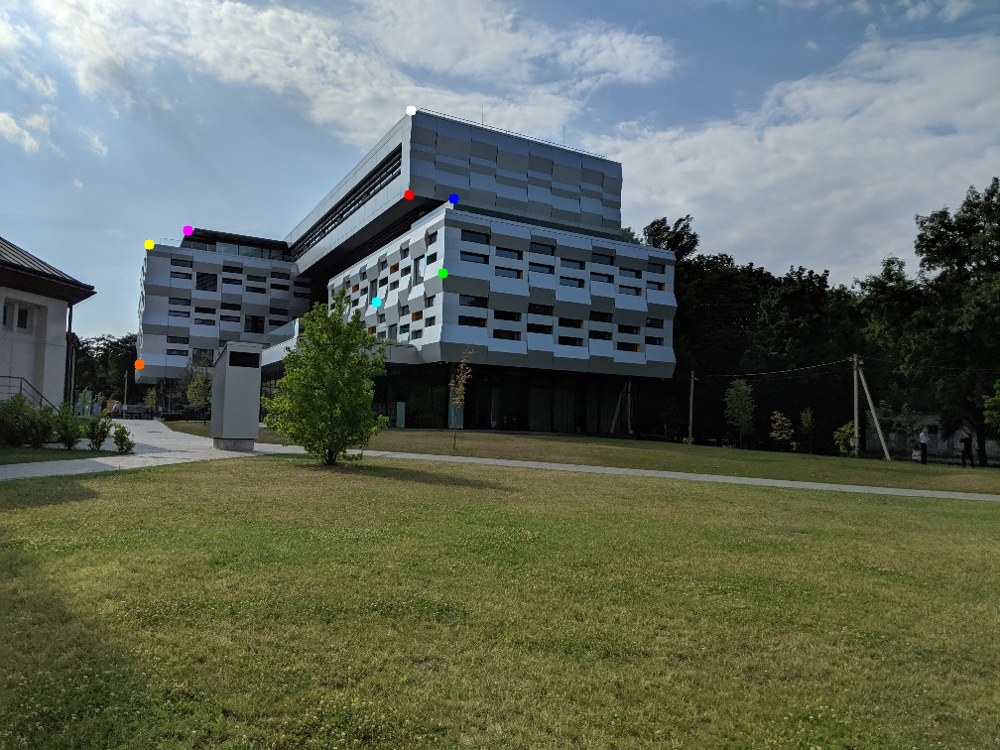

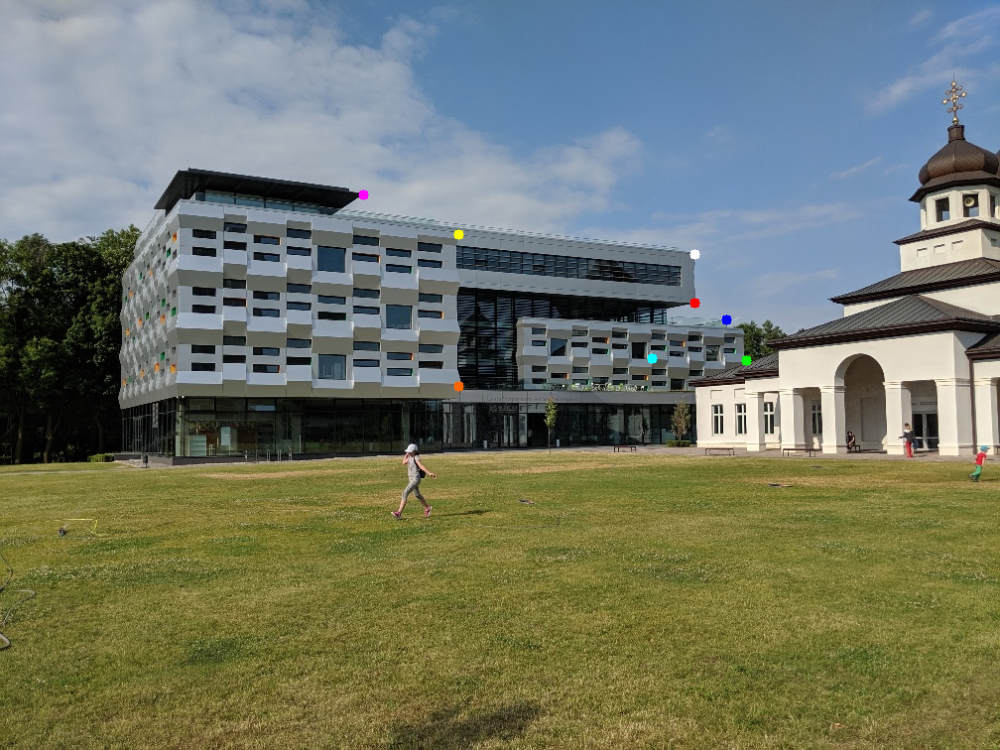

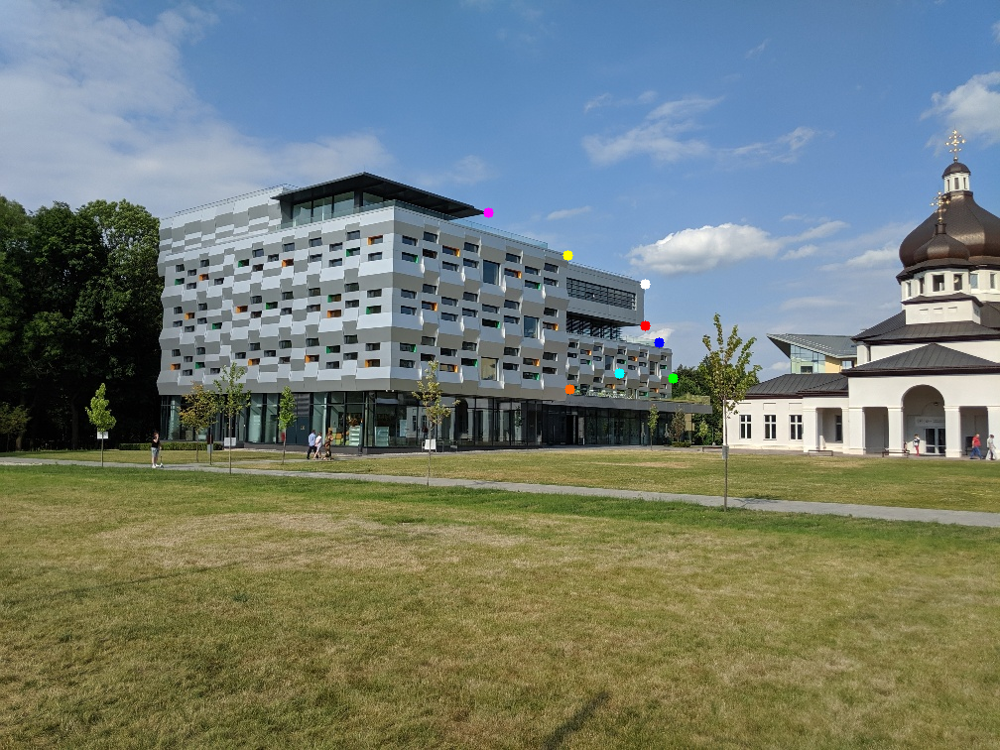

In [4]:
points = np.array([
    [[414, 111], [412, 196], [457, 200], [446, 275], [379, 304], [189, 232], [150, 246], [140, 367]],
    [[700, 256], [700, 305], [732, 322], [752, 363], [657, 361], [366, 196], [462, 236], [462, 389]],
    [[650, 286], [650, 328], [664, 345], [678, 381], [624, 376], [492, 214], [572, 257], [574, 392]],
])
show_points(0)
show_points(1)
show_points(2)

In [5]:
def normalize_2d_pts(pts):
    
    pts = pts.reshape(3,-1)
    
    f_ind = np.abs(pts[2]) > np.finfo(float).eps
    
    pts[0, f_ind] = pts[0, f_ind] / pts[2, f_ind]
    pts[1, f_ind] = pts[1, f_ind] / pts[2, f_ind]
    pts[2, f_ind] = 1
    
    # center of result points
    center = [np.mean(pts[0, f_ind]), np.mean(pts[1, f_ind])] 
    
    # shift the origin to the center point
    new_p0 = pts[0, f_ind] - center[0] 
    new_p1 = pts[1, f_ind] - center[1]

    mean_dist = np.mean(np.sqrt(new_p0**2 + new_p1**2));
    
    scale = np.sqrt(2) / mean_dist;
    
    # build transformation matrix
    T = np.eye(3)
    T[0][0] = scale
    T[1][1] = scale
    T[0][2] = -scale * center[0]
    T[1][2] = -scale * center[1]
    new_pts = T.dot(pts)
    
    return new_pts, T

In [6]:
# function return fundamental matrix
def get_fundamental_matrix(points1, points2):
    
    pts1 = np.array(points1)
    pts2 = np.array(points2)
        
    npts = pts1.shape[0]
    
    # stack points
    pts1 = np.r_[pts1.T, np.ones((1,npts))]
    pts2 = np.r_[pts2.T, np.ones((1,npts))]
    
    
    # normalize points    
    x1, transform_1 = normalize_2d_pts(pts1)
    x2, transform_2 = normalize_2d_pts(pts2)

    
    l = len(points1)
    # stack column by column
    A = np.c_[x2[0]*x1[0], x2[0]*x1[1], x2[0], x2[1]*x1[0], x2[1]*x1[1], x2[1], x1[0], x1[1], np.ones((l,1))]
    
    u, s, v = np.linalg.svd(A)
    v = v.conj().T
    F = v[:,8].reshape(3,3).copy()
    
    # force F to be rank 2 matrix
    u, s, v = np.linalg.svd(F);
    F = u.dot(np.diag([s[0], s[1], 0])).dot(v)
    
    # inverse normalization
    F = transform_2.T.dot(F).dot(transform_1)
    
    # as matrix was found up to a constant
    # dividing matrix by the last item makes matrix similar to OpenCV
    F = F / F[2,2]
    return F

get_fundamental_matrix(points[0], points[1])

array([[ 2.69147228e-07,  4.29030644e-06, -1.66198624e-03],
       [ 1.38782856e-06, -1.91845182e-07,  1.65643477e-03],
       [-8.28253450e-04, -4.22465315e-03,  1.00000000e+00]])

#### Compare custom fundamental matrix with OpenCV method

As we can see the matrices are equal

In [7]:
f, _ = cv2.findFundamentalMat(points[0], points[1], cv2.FM_8POINT)
f

array([[ 2.69147228e-07,  4.29030644e-06, -1.66198624e-03],
       [ 1.38782856e-06, -1.91845182e-07,  1.65643477e-03],
       [-8.28253450e-04, -4.22465315e-03,  1.00000000e+00]])

In [24]:
def draw_epipolar_line(img, p1, F, color, p_draw):
    h, w, _ = img.shape
    
    p1 = np.append(p1, 1)
    
    p2 = np.matmul(F, p1)
    
    lp1 = (0, int(-p2[2]/p2[1]) )
    lp2 = (w, int(-(p2[0] * w + p2[2]) / p2[1]) )
    
#     print(lp1, lp2)

    cv2.circle(img, (p_draw[0], p_draw[1]), 5, color, -1)
    
    return cv2.line(img, lp1, lp2, color, 1)

In [22]:
def draw_epipolar_lines(n1, n2, custom=False):

    img1 = cv2.imread(path + "img-%02d.jpg" % n1 )
    img2 = cv2.imread(path + "img-%02d.jpg" % n2 )
    
    if custom:
        F1 = get_fundamental_matrix(points[n1], points[n2])
        F2 = get_fundamental_matrix(points[n2], points[n1])
    else:
        F1, _ = cv2.findFundamentalMat(points[n1], points[n2], cv2.FM_8POINT)
        F2, _ = cv2.findFundamentalMat(points[n2], points[n1], cv2.FM_8POINT)

    for i in range(len(points[n1])):    
        img2 = draw_epipolar_line(img2, points[n1][i], F1, get_color(i), points[n2][i])
        img1 = draw_epipolar_line(img1, points[n2][i], F2, get_color(i), points[n1][i])
    
        
    cv2_imshow(img1)
    cv2_imshow(img2)

### Draw epipolar lines according to the fundamental matrix found by custom method.

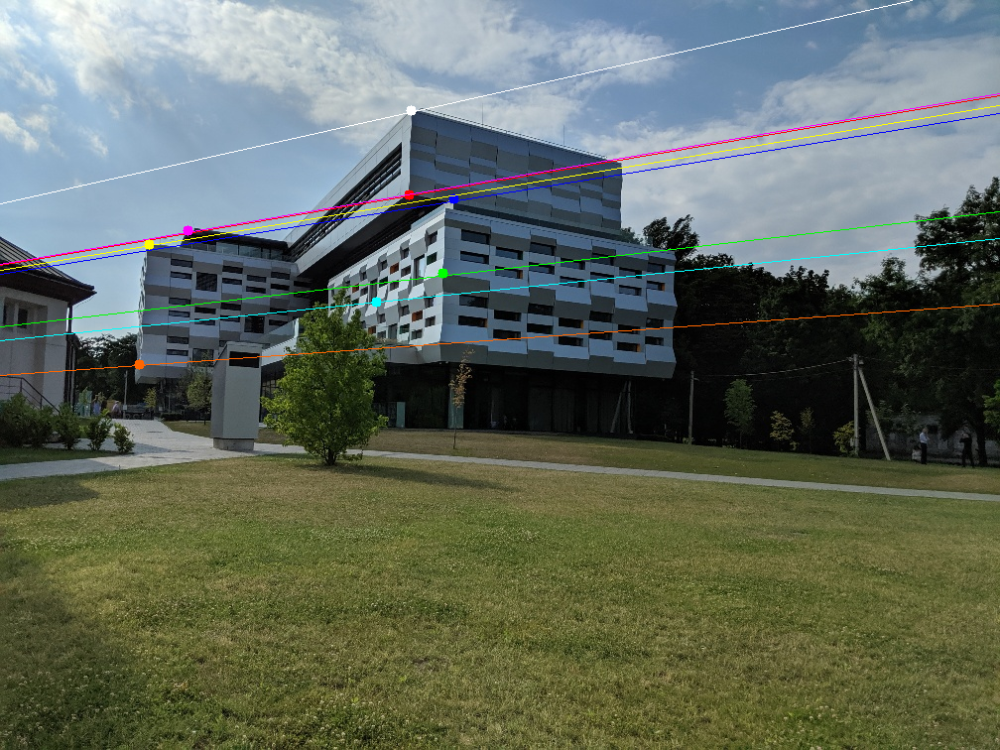

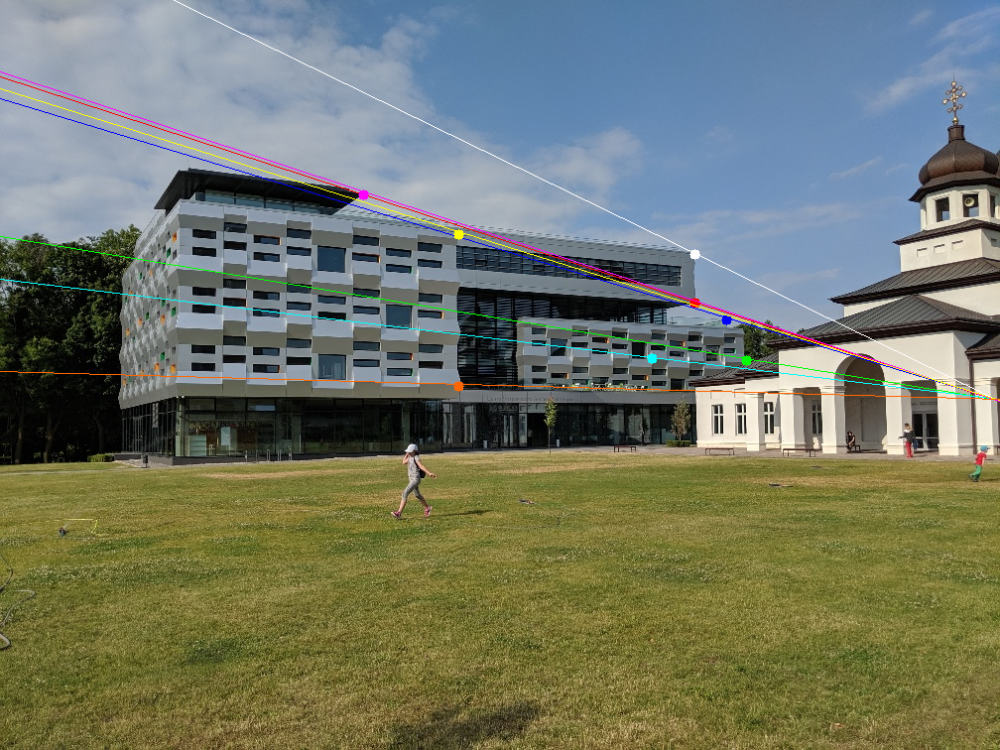

In [25]:
draw_epipolar_lines(0, 1, custom=True)

### OpenCV method to find fundamental matrix

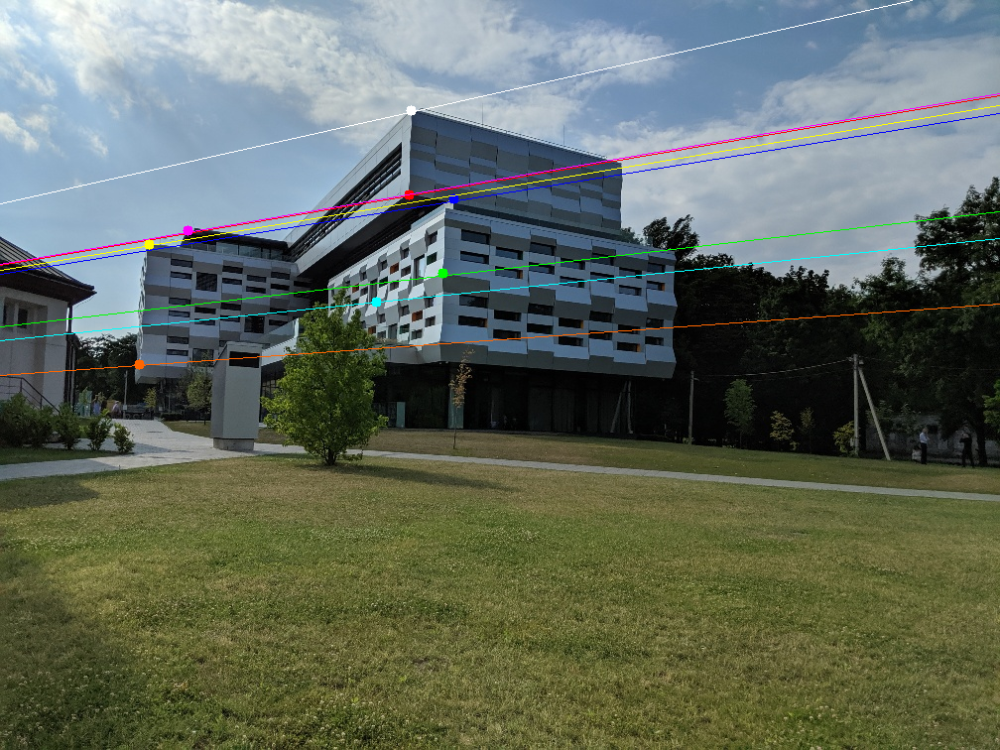

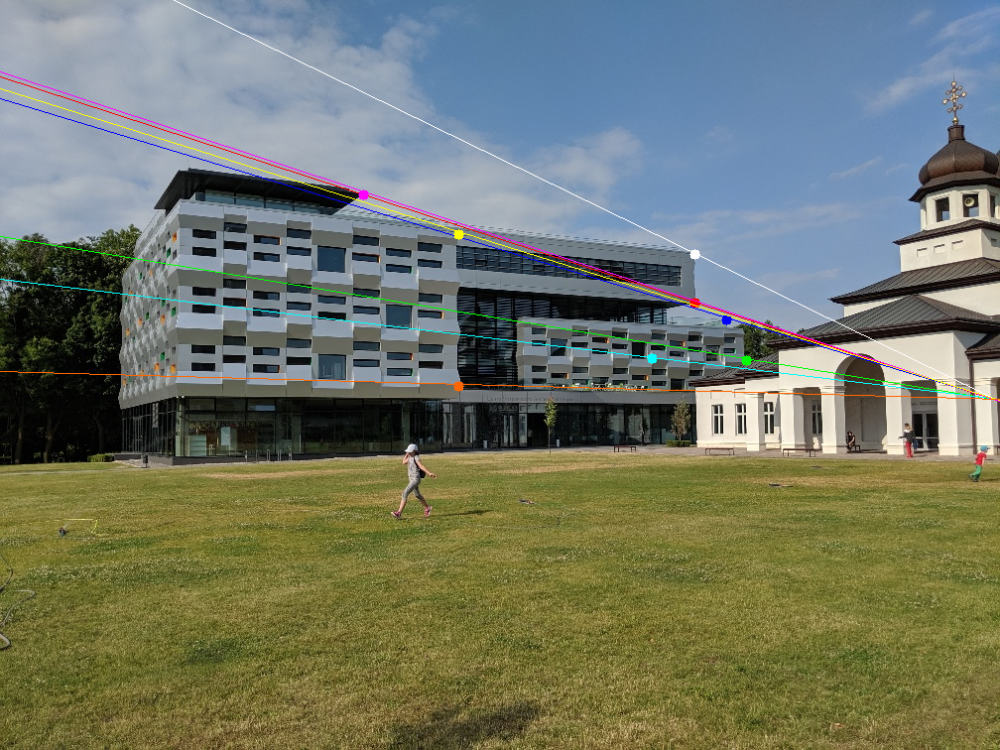

In [26]:
draw_epipolar_lines(0, 1, custom=False)

### Conclusion

As we can see the epipolar lines built by custom and OpenCV methods are equal. Also we can notice that lines are crossed in the place where I took photos. So the fundamental matrix was built correctly.